In [1]:
def plot_image(processed_image, clip_preprocesed=True):
    import matplotlib.pyplot as plt
    import numpy as np
    
    if clip_preprocesed:
        image_np = processed_image.numpy()
    else:
        image_np = processed_image

    # CLIP processor normalizes and resizes images, so we need to denormalize
    mean = np.array([0.48145466, 0.4578275, 0.40821073]).reshape(-1, 1, 1)
    std = np.array([0.26862954, 0.26130258, 0.27577711]).reshape(-1, 1, 1)

    if clip_preprocesed:
        # Denormalize
        image_np = std * image_np + mean
        # Convert from channels first to channels last
        # Clip values to [0, 1] range
        image_np = np.clip(image_np, 0, 1)
        image_np = np.transpose(image_np, (1, 2, 0))

    # Display the image
    plt.figure(figsize=(10, 10))
    plt.imshow(image_np)
    plt.axis('off')
    plt.show()
    

In [2]:
import PIL
from PIL import Image
from transformers import AutoModel

model = AutoModel.from_pretrained('jinaai/jina-clip-v2', trust_remote_code=True, device_map='mps')
truncate_dim = 512

/Users/sergeevnikita/.cache/huggingface/modules/transformers_modules/jinaai/jina-clip-implementation/51f02de9f2cf8afcd3bac4ce996859ba96f9f8e9/modeling_clip.py:137: UserWarning: Flash attention requires CUDA, disabling
  warnings.warn('Flash attention requires CUDA, disabling')
/Users/sergeevnikita/.cache/huggingface/modules/transformers_modules/jinaai/jina-clip-implementation/51f02de9f2cf8afcd3bac4ce996859ba96f9f8e9/modeling_clip.py:172: UserWarning: xFormers requires CUDA, disabling
  warnings.warn('xFormers requires CUDA, disabling')


Using a slow image processor as `use_fast` is unset and a slow processor was saved with this model. `use_fast=True` will be the default behavior in v4.52, even if the model was saved with a slow processor. This will result in minor differences in outputs. You'll still be able to use a slow processor with `use_fast=False`.


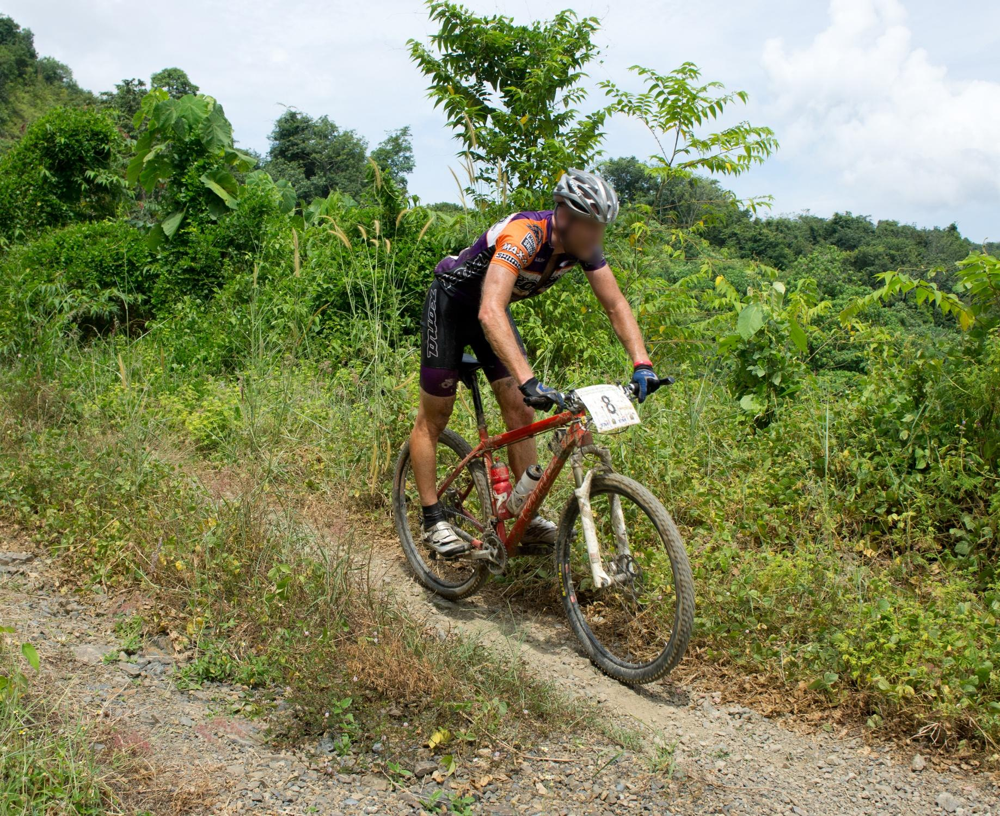

In [3]:
image_path = "../DCI/data/densely_captioned_images/photos/sa_1554758.jpg"

image = Image.open(image_path)
image_embeddings = model.encode_image(
    image, truncate_dim=truncate_dim
)
image

In [4]:
text = "A male cyclist wearing a helmet and a racing jersey riding a mountain bike on a narrow dirt trail in a lush green forest during a mountain biking competition, numbered bib on the handlebars, surrounded by dense vegetation and hills, daytime, outdoor action shot"
text_embeddings = model.encode_text(text, truncate_dim=truncate_dim, task="retrieval.query")

In [5]:
import torch
from torch.nn import functional as F

t_tensor = torch.tensor(text_embeddings)
i_tensor = torch.tensor(image_embeddings)

sim = F.cosine_similarity(t_tensor, i_tensor, dim=-1)

t_tensor @ i_tensor, text_embeddings @ image_embeddings, sim

(tensor(0.4164), 0.41636342, tensor(0.4164))

In [6]:
from densely_captioned_images.dataset.dense_image import DenseCaptionedImage

# Load an image by its ID
dci = DenseCaptionedImage(img_id=640)  # Replace with actual image ID

# Get the image as a numpy array
image = dci.get_image()

# Get the full formatted description
full_description = dci.get_formatted_complete_description()[0]['caption']

# Alternatively, get base caption and extended caption
base_caption = dci.get_base_caption()[0]['caption']  # Short caption
extended_caption = dci.get_extended_caption()[0]['caption']  # More detailed

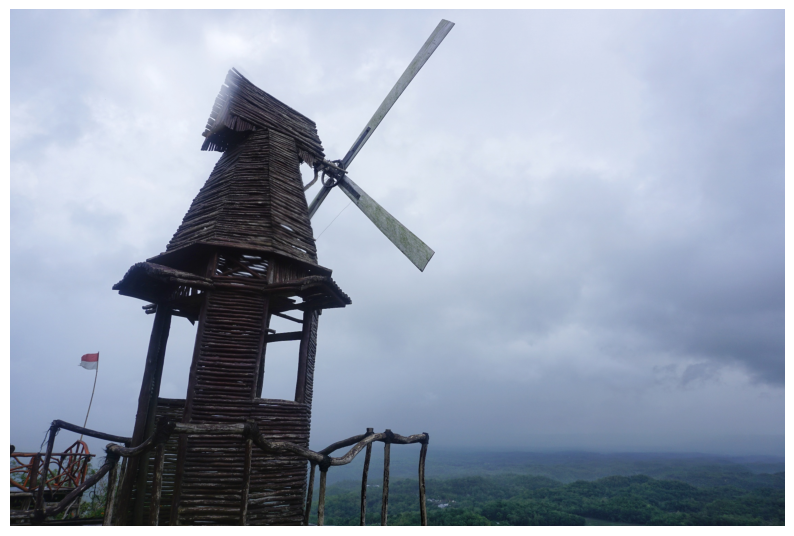

In [7]:
plot_image(image, clip_preprocesed=False)

25
This is an image of X-sticks above center. Directly above the rectangular wooden piece in the center of the windmill, there is a rectangular space with two sticks that make a wide "X".  Behind the sticks, you can see another row of horizontal sticks.  There is space between the sticks so we can see the white from the clouds in the background. 


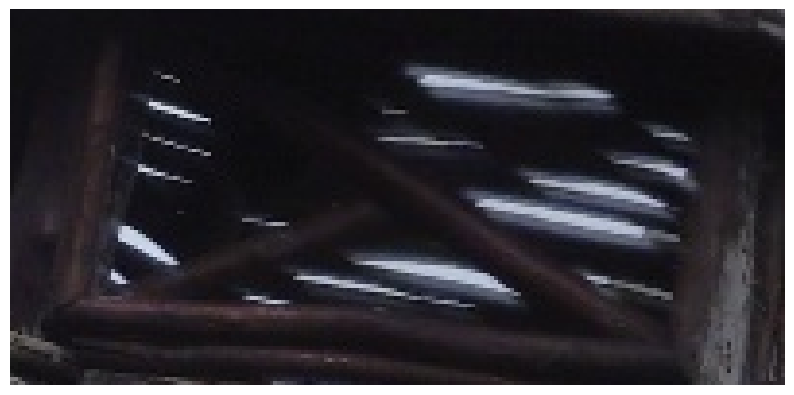

In [8]:
all_masks = dci.get_all_masks()
print(len(all_masks))
sample = dci.get_caption_with_subcaptions(all_masks[17])

sample_image = sample[0]['image']
sample_caption = sample[0]['caption']

print(sample_caption)
plot_image(sample_image, clip_preprocesed=False)

In [9]:
import PIL.Image


sample_image_emb = model.encode_image(
    PIL.Image.fromarray(sample_image.astype('uint8'), 'RGB'), truncate_dim=truncate_dim
)
sample_text_emb = model.encode_text(
    "photo of a man", truncate_dim=truncate_dim, task='retrieval.query'
)

sample_image_emb @ sample_text_emb

0.1326148

In [10]:
from densely_captioned_images.dataset.dense_image import get_dci_count

get_dci_count()

7805

In [11]:
import glob
import os
import torch
from tqdm import tqdm

emb_folder = '../dense_index_v2/embeds'

img_files = sorted(glob.glob(os.path.join(emb_folder, "image_embeds_*.pt")))
query_files = sorted(glob.glob(os.path.join(emb_folder, "description_embeds_*.pt")))

queries = []
for file in query_files:
    q = torch.load(file)
    queries.append(q)


# for i in range(len(queries)):
#     for j in range(i+1, len(queries)):
#         for e in range(min(queries[i].shape[0], queries[j].shape[0])):
#             for k in range(queries[i].shape[1]):
#                 if torch.allclose(queries[i][e][k], queries[j][e][k]):
#                     try:
#                         assert torch.allclose(queries[i][e][k], torch.zeros_like(queries[i][e][k]))
#                         assert torch.allclose(queries[j][e][k], torch.zeros_like(queries[j][e][k]))
#                     except:
#                         print(e, k)

In [12]:
test_emb = "This is an image of leftmost glass pane. the glass pane along the left border."
test_emb_tensor = model.encode_text(test_emb, truncate_dim=truncate_dim, task='retrieval.query')
print(test_emb_tensor.shape)


max_sim = -1
max_sim_index = -1


queries = []
for file in query_files:
    q = torch.load(file)
    q = q.reshape(-1, 512)
    print(q.shape)
    for i in tqdm(range(q.shape[0])):
        sim = test_emb_tensor @ q[i].numpy()
        if sim > max_sim:
            max_sim = sim
            max_sim_index = i

    print(file)
    print(max_sim_index)
    print(max_sim)
    print('='*100)
    max_sim = -1
    max_sim_index = -1

(512,)
torch.Size([104000, 512])


100%|██████████| 104000/104000 [00:00<00:00, 421489.21it/s]

../dense_index_v2/embeds/description_embeds_0.pt
93102
0.8064481


In [13]:
41513 // 104, 41513 % 104 

(399, 17)

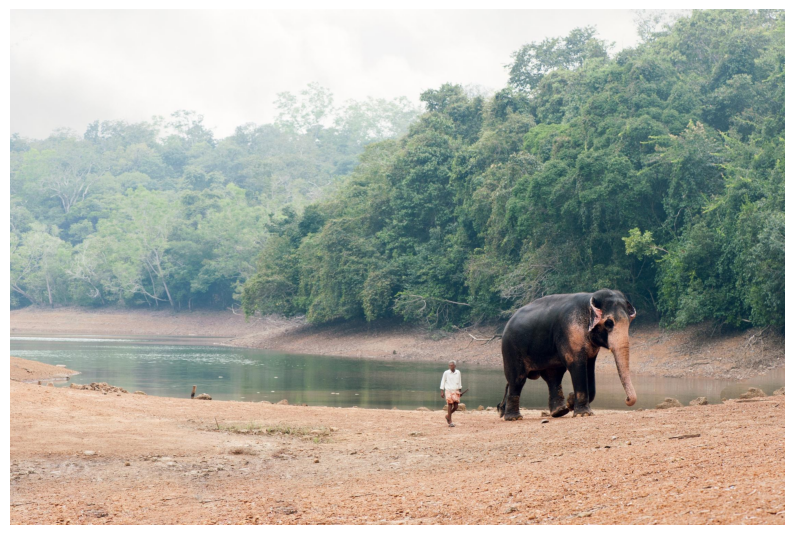

In [14]:
dci = DenseCaptionedImage(img_id=399)  # Replace with actual image ID
image = dci.get_image()
full_description = dci.get_formatted_complete_description()[0]['caption']

plot_image(image, clip_preprocesed=False)

In [19]:
dci.get_formatted_complete_description()[0]['caption']

"There is a man walking with an elephant on the brown ground with a small water area and trees in the background. \nThere is a man walking with an elephant on the brown ground with a small water area and trees in the background. He in a little towards the right, and the elephant is a little ahead of him. The elephant’s trunk is down. They are on a brown dirt ground that has rocks and texture. Behind them is a small pond with green water. Behind the pond, the brown ground slopes up gently. There are a lot of full green trees. The sky is gray. It is daytime.\nThe following can also be seen in the image:\nbrown ground: The ground is brown and made of dirt. It is textured. It is sloping up gently up.\nbrown ground: The ground is brown and made of dirt. It is textured. It is sloping up gently to the right. There are some old branches, too. \nbrown ground: The ground is brown and made of dirt. It is textured. It is sloping up gently up.\ntop of trees: The tops of the trees are different shad

36
This is an image of trees. There are a bunch of trees next to each other. There are green trees with a lot of leaves. There are many branches that branch out from the bark.


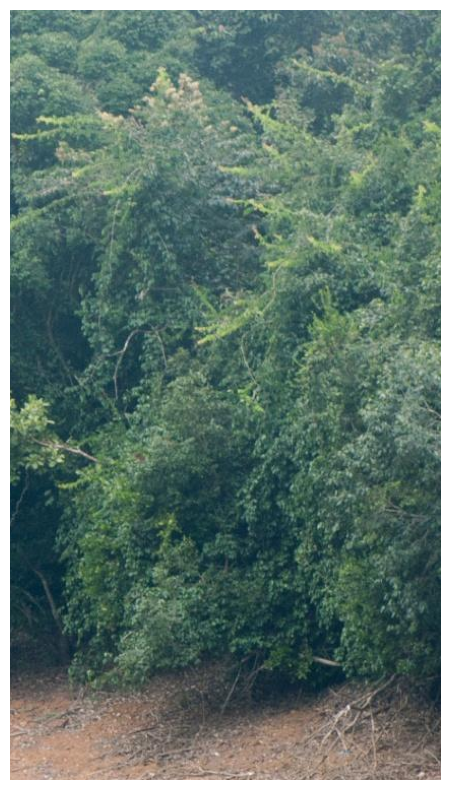

In [15]:
all_masks = dci.get_all_masks()
print(len(all_masks))
sample = dci.get_caption_with_subcaptions(all_masks[7])

sample_image = sample[0]['image']
sample_caption = sample[0]['caption']

print(sample_caption)
plot_image(sample_image, clip_preprocesed=False)

In [16]:
sample_caption

'This is an image of trees. There are a bunch of trees next to each other. There are green trees with a lot of leaves. There are many branches that branch out from the bark.'